In [1]:
!pip install tensorflow-addons
!pip install tensorflow-hub
!pip install tensorflow_text

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 591.0/591.0 kB 36.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.5/6.5 MB 20.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 524.1/524.1 MB 2.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 55.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 44.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 440.8/440.8 kB 40.2 MB/s eta 0:00:00
  Attempting uninstall: typing-extensions
    Found existing installation: typing_extensions 4.6.3
    Uninstalling typing_extensions-4.6.3:
      Successfully uninstalled typing_extensions-4.6.3
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.12.0
    Uninstalling tensorflow-estimator-2.12.0:
      Successfully uninstalled tensorflow-estimator-2.12.0
  Attempting uninstall: keras
    Found existing installation: keras 2.12.0
    Uninstalling keras-2.12.0:
      

In [2]:
import os
import cv2
import gc
import numpy as np
import pandas as pd
import itertools
from tqdm.autonotebook import tqdm
import albumentations as A
import matplotlib.pyplot as plt

import collections
import json
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import tensorflow_hub as hub
import tensorflow_text as text
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tqdm import tqdm
import pandas as pd
from sklearn.model_selection import train_test_split

import torch
from torch import nn
import torch.nn.functional as F

# Suppressing tf.hub warnings
tf.get_logger().setLevel("ERROR")
tfk = tf.keras
tfkl = tf.keras.layers

<ipython-input-2-e8d7adb259c7>:7: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [3]:
!pip install bert-for-tf2

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.2/41.2 kB 2.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Created wheel for bert-for-tf2: filename=bert_for_tf2-0.14.9-py3-none-any.whl size=30515 sha256=7babb72ba607b8bb643d565456c2b260346a81f599dc3b2feb0ba8b5edf0d9d2
  Stored in directory: /root/.cache/pip/wheels/d8/da/50/126d7b8416d9a0e6bf876935c2219a71e72a6529c25e150c56
  Created wheel for params-flow: filename=params_flow-0.8.2-py3-none-any.whl size=19457 sha256=ffdeed55b7cf4c48ae7914782f47ba07546980632b7c13bd53098025eb950cdc
  Stored in directory: /root/.cache/pip/wheels/97/a8/d0/f7419404174976a2686bb98b5c30df01cc71445415f32db9e6
  Created wheel for py-params: filename=py_params-0.10.2-py3-none-any.whl size=7892 sha256=8efadc998d1aa489b3202f64f79aa5c6dc1466684d49976a8011659411e23d60
  Stored in directory: /root/.cache/pip/wheels/69/c8/b3/92666cff9fb312bc3473eaa6b396695b89a7b3e31e908768

In [4]:
!ls -lha kaggle.json
!pip install -q kaggle # installing the kaggle package
!mkdir -p ~/.kaggle # creating .kaggle folder where the key should be placed
!cp kaggle.json ~/.kaggle/ # move the key to the folder
!pwd # checking the present working directory
!chmod 600 ~/.kaggle/kaggle.json

-rw-r--r-- 1 root root 65 Jul  7 14:34 kaggle.json
/content


In [5]:
!kaggle datasets list

ref                                                               title                                                size  lastUpdated          downloadCount  voteCount  usabilityRating  
----------------------------------------------------------------  --------------------------------------------------  -----  -------------------  -------------  ---------  ---------------  
alphiree/cardiovascular-diseases-risk-prediction-dataset          Cardiovascular Diseases Risk Prediction Dataset       5MB  2023-07-03 12:12:19            733         30  1.0              
arnavsmayan/netflix-userbase-dataset                              Netflix Userbase Dataset                             25KB  2023-07-04 07:38:41            815         24  1.0              
aaditshukla/flipkart-fasion-products-dataset                       Ecommerce Product dataset                           15MB  2023-07-04 05:44:07            448         22  0.9411765        
arthurchongg/imdb-top-1000-movies                 

In [6]:
### For Flickr 8k
!kaggle datasets download -w joonrisse/hackathonriseoftransformers

 99% 251M/253M [00:12<00:00, 24.2MB/s]
100% 253M/253M [00:12<00:00, 21.9MB/s]


In [7]:
! unzip hackathonriseoftransformers.zip

Streaming output truncated to the last 5000 lines.
  inflating: resized_train/resized_train/ImageCLEFmedCaption_2022_train_078711.jpg  
  inflating: resized_train/resized_train/ImageCLEFmedCaption_2022_train_078712.jpg  
  inflating: resized_train/resized_train/ImageCLEFmedCaption_2022_train_078713.jpg  
  inflating: resized_train/resized_train/ImageCLEFmedCaption_2022_train_078714.jpg  
  inflating: resized_train/resized_train/ImageCLEFmedCaption_2022_train_078715.jpg  
  inflating: resized_train/resized_train/ImageCLEFmedCaption_2022_train_078716.jpg  
  inflating: resized_train/resized_train/ImageCLEFmedCaption_2022_train_078717.jpg  
  inflating: resized_train/resized_train/ImageCLEFmedCaption_2022_train_078718.jpg  
  inflating: resized_train/resized_train/ImageCLEFmedCaption_2022_train_078719.jpg  
  inflating: resized_train/resized_train/ImageCLEFmedCaption_2022_train_078720.jpg  
  inflating: resized_train/resized_train/ImageCLEFmedCaption_2022_train_078721.jpg  
  inflating: r

In [8]:
df = pd.read_csv("/content/caption_prediction_train.csv", delimiter="\t")
df.head()

,ID,caption
0,ImageCLEFmedCaption_2022_train_000001,pericardial tamponade with clear distinction o...
1,ImageCLEFmedCaption_2022_train_000002,angiography of the aortic arch show delay visu...
2,ImageCLEFmedCaption_2022_train_000003,balloonocclude retrograde transvenous oblitera...
3,ImageCLEFmedCaption_2022_train_000004,film after glue embolization show no filling i...
4,ImageCLEFmedCaption_2022_train_000005,peripheral in posteroanterior projection angio...


In [9]:
class CFG:
    debug = False
    image_path = "/content/resized_train/resized_train"
    captions_path = "."
    batch_size = 32
    num_workers = 4
    head_lr = 1e-3
    image_encoder_lr = 1e-4
    text_encoder_lr = 1e-5
    weight_decay = 1e-3
    patience = 1
    factor = 0.8
    epochs = 2
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    model_name = 'resnet50'
    image_embedding = 2048
    text_encoder_model = "distilbert-base-uncased"
    text_embedding = 768
    text_tokenizer = "distilbert-base-uncased"
    max_length = 200

    pretrained = True # for both image encoder and text encoder
    trainable = True # for both image encoder and text encoder
    temperature = 1.0

    # image size
    size = 16

    # for projection head; used for both image and text encoders
    num_projection_layers = 1
    projection_dim = 512
    dropout = 0.1

In [10]:
import tensorflow as tf
import cv2

class CLIPDataset(tf.keras.utils.Sequence):
    def __init__(self, image_filenames, captions,  batch_size=32):
        """
        image_filenames and captions must have the same length; so, if there are
        multiple captions for each image, the image_filenames must have repetitive
        file names
        """

        self.image_filenames = image_filenames
        self.captions = list(captions)
        self.batch_size = batch_size

    def __len__(self):
        return len(self.image_filenames) // self.batch_size

    def __getitem__(self, idx):
        batch_image_filenames = self.image_filenames[idx*self.batch_size:(idx+1)*self.batch_size]
        batch_captions = self.captions[idx*self.batch_size:(idx+1)*self.batch_size]

        batch_images = []
        for filename in batch_image_filenames:
            image = cv2.imread(f"{CFG.image_path}/{filename}.jpg")
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            image = cv2.resize(image, (64, 64))
            batch_images.append(image)

        batch_items = {}
        batch_items['image'] = tf.stack(batch_images)
        batch_items['caption'] = tf.constant(batch_captions)

        return batch_items

In [11]:
from sklearn.model_selection import train_test_split
train_df, valid_df = train_test_split(df, test_size=0.10, shuffle=True)

In [12]:
import tensorflow as tf
from tensorflow.keras import layers

class ProjectionHead(tf.keras.Model):
    def __init__(
        self,
        embedding_dim,
        projection_dim=CFG.projection_dim,
        dropout=CFG.dropout
    ):
        super(ProjectionHead, self).__init__()

        self.projection = tf.keras.layers.Dense(projection_dim)
        self.gelu = tf.keras.layers.Activation(tf.nn.gelu)
        self.fc = tf.keras.layers.Dense(projection_dim)
        self.dropout = tf.keras.layers.Dropout(dropout)
        self.layer_norm = tf.keras.layers.LayerNormalization()

    def call(self, x):
        projected = self.projection(x)
        x = self.gelu(projected)
        x = self.fc(x)
        x = self.dropout(x)
        x = x + projected
        x = self.layer_norm(x)
        return x

In [13]:
class VisionEncoder(tf.keras.Model):
    def __init__(self, trainable=True):
        super(VisionEncoder, self).__init__()

        # Load the pre-trained ResNet50 model to be used as the base encoder.
        self.resnet = tf.keras.applications.ResNet50(
            include_top=False, weights='imagenet', pooling="avg"
        )
        # Set the trainability of the base encoder.
        for layer in self.resnet.layers:
            layer.trainable = trainable

    def call(self, inputs):
        # Preprocess the input image.
        resnet_input = tf.keras.applications.resnet.preprocess_input(inputs)
        # Generate the embeddings for the images using the ResNet50 model.
        embeddings = self.resnet(resnet_input)

        return embeddings

In [14]:
class TextEncoder(tf.keras.Model):
    def __init__(self, model_name=CFG.text_encoder_model, pretrained=CFG.pretrained, trainable=CFG.trainable):
        super(TextEncoder, self).__init__()
        self.preprocessor = hub.KerasLayer("https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3")
        self.encoder = hub.KerasLayer("https://tfhub.dev/tensorflow/bert_en_uncased_L-12_H-768_A-12/4", trainable=trainable)
        self.target_token_idx = 0

    def call(self, inputs):
        encoder_inputs = self.preprocessor(inputs)
        outputs = self.encoder(encoder_inputs)
        pooled_output = outputs["pooled_output"]
        return pooled_output

In [15]:
class DualEncoder(tfk.Model):
    def __init__(self, text_encoder, image_encoder, temperature=CFG.temperature, image_embedding=CFG.image_embedding, text_embedding=CFG.text_embedding, **kwargs):
        super(DualEncoder, self).__init__(**kwargs)
        self.text_encoder = text_encoder
        self.image_encoder = image_encoder
        self.image_projection = ProjectionHead(embedding_dim=image_embedding)
        self.text_projection = ProjectionHead(embedding_dim=text_embedding)
        self.temperature = temperature

    def call(self, inputs):
        # Getting Image and Text inputs
        with tf.device("/gpu:0"):
            image_embeddings = self.image_encoder(inputs['image'])
            image_embeddings = self.image_projection(image_embeddings)
        with tf.device("/gpu:1"):
            text_embeddings = self.text_encoder(inputs['caption'])
            text_embeddings = self.text_projection(text_embeddings)
        return image_embeddings, text_embeddings

In [16]:
def get_ground_truth(num_logits):
    labels = tf.range(num_logits, dtype=tf.int32)
    return labels

def get_logits(image_features, text_features, logit_scale=0.7):
    logits_per_image = logit_scale * tf.matmul(image_features, text_features, transpose_b=True)
    logits_per_text = logit_scale * tf.matmul(text_features, image_features, transpose_b=True)
    return logits_per_image, logits_per_text

def clip_loss(image_features, text_features, logit_scale, output_dict=False):
    logits_per_image, logits_per_text = get_logits(image_features, text_features, logit_scale)
    labels = get_ground_truth(logits_per_image.shape[0])
    total_loss = (
        tf.reduce_mean(tf.keras.metrics.sparse_categorical_crossentropy(y_true=labels, y_pred=logits_per_image, from_logits=True)) +
        tf.reduce_mean(tf.keras.metrics.sparse_categorical_crossentropy(y_true=labels, y_pred=logits_per_text, from_logits=True))
    ) / 2
    if output_dict:
        return {"contrastive_loss": total_loss}
    else:
        return total_loss

In [17]:
vision_encoder = VisionEncoder()
text_encoder = TextEncoder()

model = DualEncoder(text_encoder, vision_encoder)
model.compile(
    optimizer=tf.optimizers.Adam(learning_rate=0.00001)
)

94765736/94765736 [==============================] - 5s 0us/step


In [18]:
optimizer = tf.optimizers.Adam(learning_rate= 0.00001)

In [19]:
dataset = CLIPDataset(
        train_df["ID"].values,
        train_df["caption"].values)

valid_dataset = CLIPDataset(
        valid_df["ID"].values,
        valid_df["caption"].values    )

In [20]:
loss_values = []
loss_values_validation = []

In [21]:
def validation(model, valid_dataset):
    for batch in valid_dataset:
        image_embeddings, text_embeddings = model(batch)
        loss = clip_loss(image_embeddings, text_embeddings, logit_scale=1)
        return {"loss": loss}

In [22]:
for epoch in range(5):
    step = 0
    patience = 0
    pre_loss = 0
    loss_value = 0
    for batch in dataset:
        pre_loss = loss_value
        with tf.GradientTape() as tape:
            image_embeddings, text_embeddings = model(batch)
            loss_value = clip_loss(image_embeddings, text_embeddings, logit_scale=1)
            loss_values.append(loss_value)

        grads = tape.gradient(loss_value, model.trainable_weights)
        # Run one step of gradient descent by updating
        # the value of the variables to minimize the loss.
        optimizer.apply_gradients(zip(grads, model.trainable_weights))
        step +=1
        # Log every 200 batches
        if step % 1 == 0:
            print("Training loss (for one batch) at step %d: %.4f"% (step, loss_value))
    print("-----------------------------------------------------------------------")
    print("-----------------------------------------------------------------------")
    loss_value_val = validation(model, valid_dataset)
    print("Validation Loss Epoch ", epoch+1, ":", loss_value_val)
    loss_values_validation.append(loss_value_val)
    print("-----------------------------------------------------------------------")
    print("-----------------------------------------------------------------------")

Streaming output truncated to the last 5000 lines.
Training loss (for one batch) at step 632: 2.8356
Training loss (for one batch) at step 633: 3.0928
Training loss (for one batch) at step 634: 3.1357
Training loss (for one batch) at step 635: 2.7515
Training loss (for one batch) at step 636: 2.7343
Training loss (for one batch) at step 637: 2.9009
Training loss (for one batch) at step 638: 2.8810
Training loss (for one batch) at step 639: 2.8135
Training loss (for one batch) at step 640: 2.9150
Training loss (for one batch) at step 641: 2.8686
Training loss (for one batch) at step 642: 2.7660
Training loss (for one batch) at step 643: 2.8705
Training loss (for one batch) at step 644: 2.8592
Training loss (for one batch) at step 645: 3.2475
Training loss (for one batch) at step 646: 2.6889
Training loss (for one batch) at step 647: 2.9333
Training loss (for one batch) at step 648: 2.8183
Training loss (for one batch) at step 649: 3.0134
Training loss (for one batch) at step 650: 2.7824

KeyboardInterrupt: ignored

In [23]:
model.save_weights("/content/model_weights.h5")

In [24]:
np.save('loss_values.npy', np.array(loss_values, dtype=object))
np.save('loss_values_validation.npy', np.array(loss_values_validation, dtype=object))

## Image retrieval

In [25]:
valid_image_embeddings = []
valid_caption_embeddings = []
for batch in valid_dataset:
    image_embeddings, text_embeddings = model(batch)
    valid_image_embeddings.append(image_embeddings)
    valid_caption_embeddings.append(text_embeddings)

In [26]:
valid_original_images = []
valid_original_captions = []
for batch in valid_dataset:
    valid_original_images.append(batch["image"])
    valid_original_captions.append(batch["caption"])

In [27]:
def find_matches(model, image_embeddings, query, image_filenames, n=9):
    text_features = model.text_encoder(tf.constant([query]))
    text_embeddings = model.text_projection(text_features)

    #Normalize image embeddings
    image_embeddings_n = tf.math.l2_normalize(tf.concat(valid_image_embeddings, axis=0), axis=-1)

    # Normalize text embeddings
    text_embeddings_n = tf.math.l2_normalize(text_embeddings, axis=-1)

    # Calculate dot similarity between text and image embeddings
    dot_similarity = tf.matmul(text_embeddings_n, image_embeddings_n, transpose_b=True)

    # Get top n * 5 matches
    values, indices = tf.math.top_k(tf.squeeze(dot_similarity), k=n * 5)
    matches = [image_filenames[idx] for idx in indices[::5]]

    _, axes = plt.subplots(3, 3, figsize=(10, 10))
    for match, ax in zip(matches, axes.flatten()):
        image = cv2.imread(f"{CFG.image_path}/{match}.jpg")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        ax.imshow(image)
        ax.axis("off")

    plt.show()

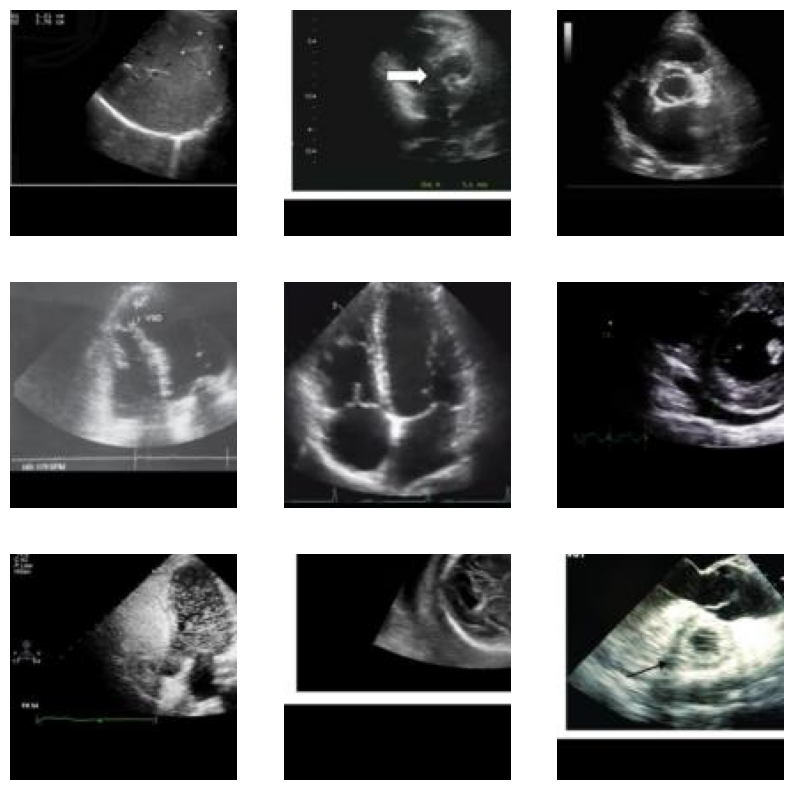

In [28]:
find_matches(model, valid_image_embeddings, query="pericardial tamponade", image_filenames=valid_df['ID'].values, n=9)

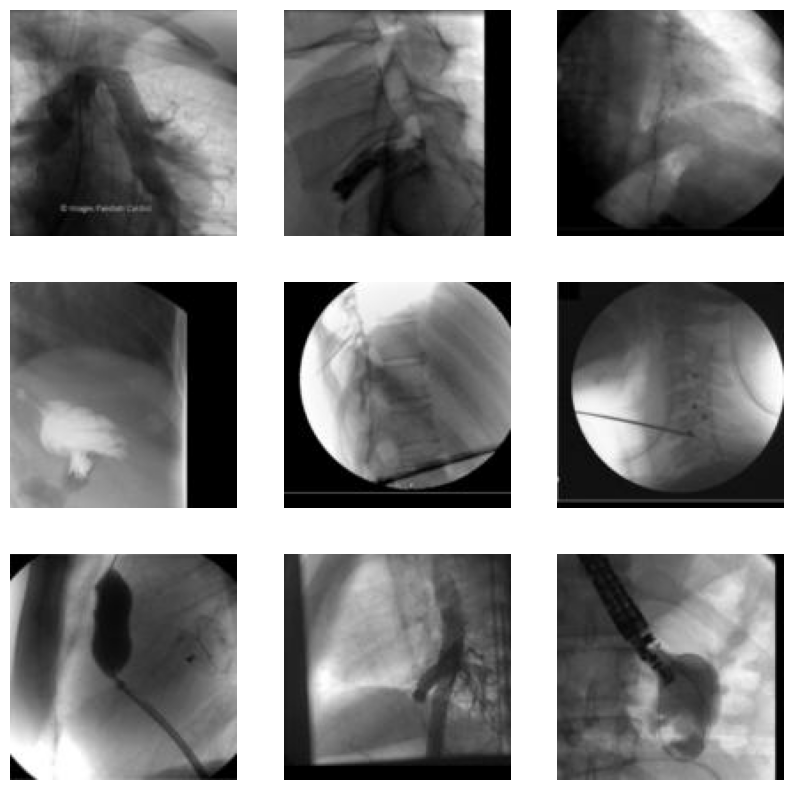

In [29]:
find_matches(model, valid_image_embeddings, query="balloon catheter", image_filenames=valid_df['ID'].values, n=9)

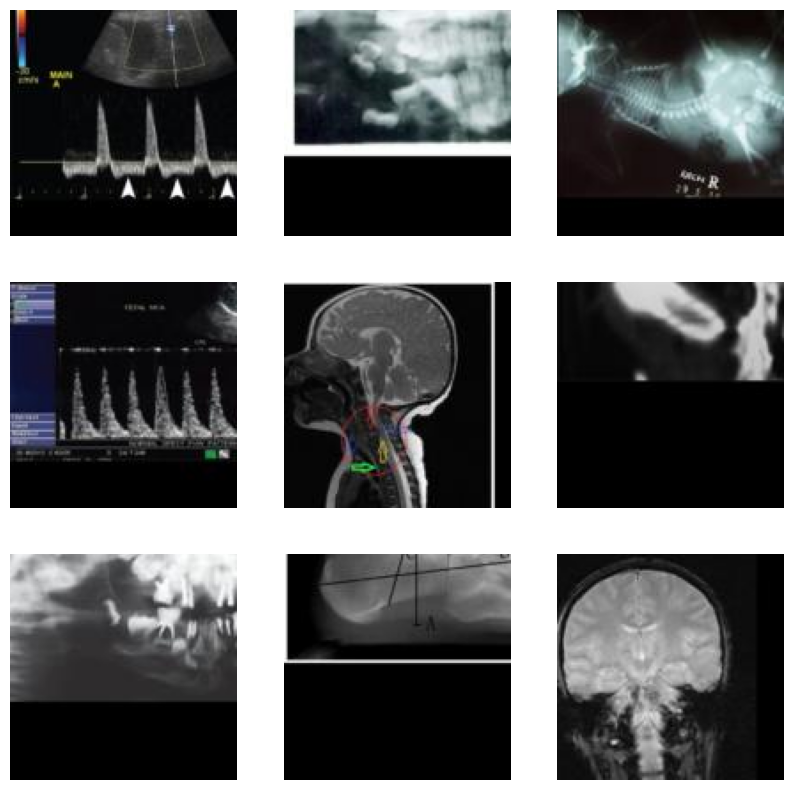

In [30]:
find_matches(model, valid_image_embeddings, query="visualization of the foramen ovale", image_filenames=valid_df['ID'].values, n=9)

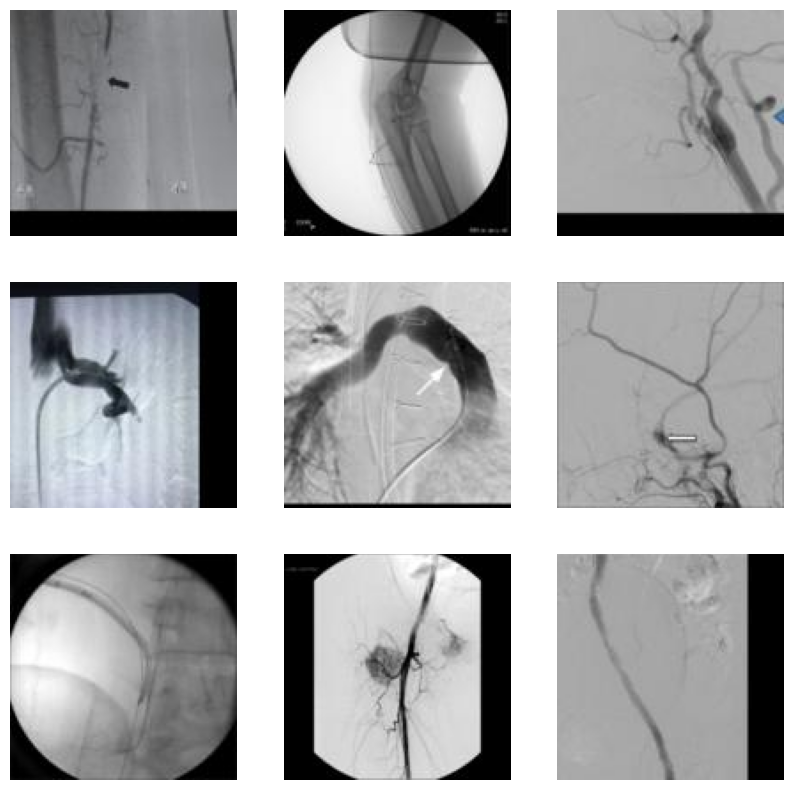

In [31]:
find_matches(model, valid_image_embeddings, query="angiography", image_filenames=valid_df['ID'].values, n=9)

## Zero Shot Learning

In [78]:
labels = pd.read_csv("/content/concepts.csv")
labels.head()

,concept,concept_name
0,C2825493,Non-Enhancing Lesion
1,C0922672,Right lateral rectus
2,C1167956,Cardiac Resynchronization Therapy
3,C0030288,Pancreatic duct
4,C0815700,Right obturator internus


In [79]:
text_descriptions = []
for index, row in labels.iterrows():
    label = row["concept_name"]
    text_descriptions.append(label)

In [80]:
def get_label_embeddings(text_descriptions):
  label_embeddings= []
  for label in text_descriptions:
    text_features = model.text_encoder(tf.constant([label]))
    text_embeddings = model.text_projection(text_features)
    label_embeddings.append(text_embeddings)
  return tf.concat(label_embeddings, axis=0)

In [81]:
label_embeddings = get_label_embeddings(text_descriptions)

In [82]:
image_embeddings_n = tf.math.l2_normalize(tf.concat(valid_image_embeddings, axis=0), axis=-1)
label_embeddings_n = tf.math.l2_normalize(label_embeddings, axis=-1)

In [83]:
text_probs = keras.activations.softmax(tf.matmul(image_embeddings_n, label_embeddings_n, transpose_b=True) * 100.0)
top_probs, top_indices = tf.math.top_k(text_probs, k=5)

In [84]:
top_probs

<tf.Tensor: shape=(8320, 5), dtype=float32, numpy=
array([[0.00033595, 0.00032699, 0.00031759, 0.00031323, 0.00030796],
       [0.00031987, 0.00030274, 0.00030216, 0.00030091, 0.0002994 ],
       [0.0004012 , 0.00039443, 0.00039076, 0.0003889 , 0.00037866],
       ...,
       [0.0005521 , 0.00053277, 0.00052599, 0.00050228, 0.00050021],
       [0.00047175, 0.00041585, 0.00039606, 0.00038848, 0.00038324],
       [0.00038093, 0.0003452 , 0.00033926, 0.00033708, 0.00032055]],
      dtype=float32)>

In [85]:
image_filenames = valid_df['ID'].values

ValueError: ignored

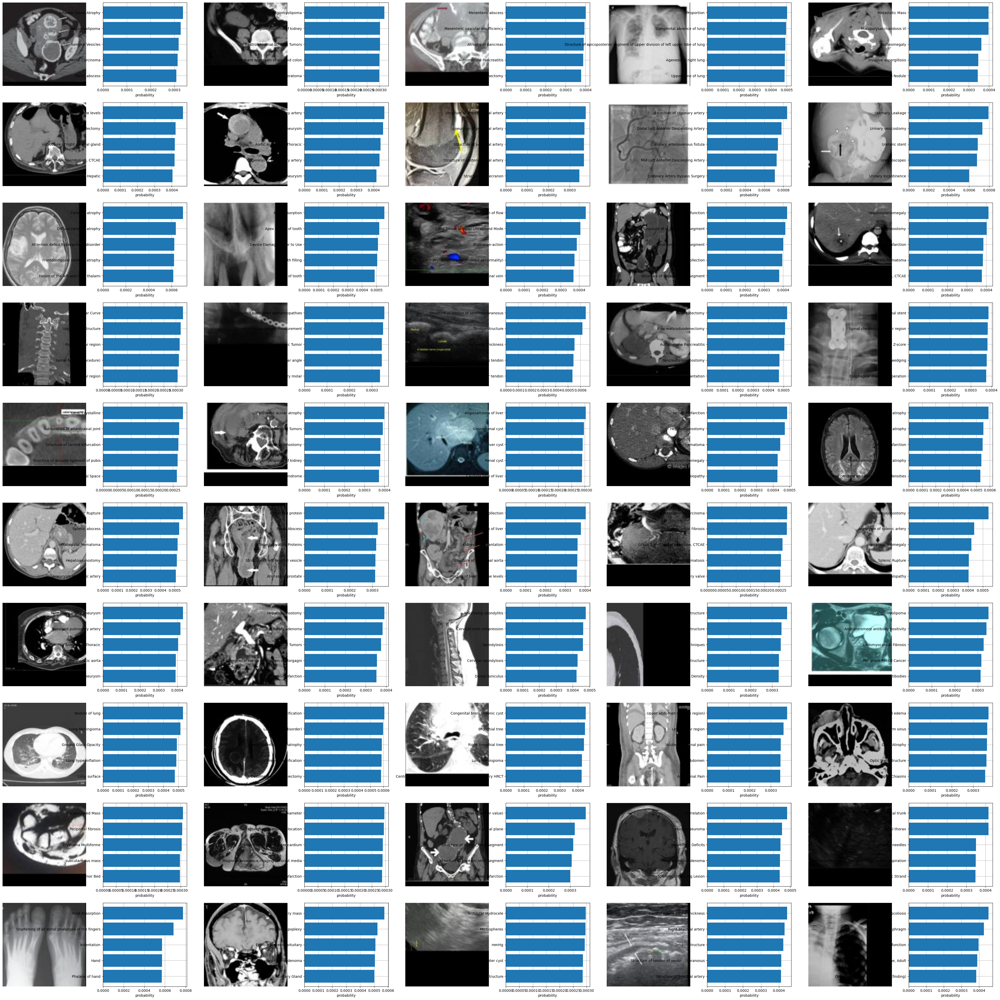

In [87]:
fig = plt.figure(figsize=(50, 50))  # Set the desired figure size
pre_element = "nothing"
counter = 0
for i, element in enumerate(image_filenames):
    if pre_element != element:
      pre_element = element
      image = cv2.imread(f"{CFG.image_path}/{element}.jpg")
      image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
      plt.subplot(10, 10, 2 * counter + 1)
      plt.imshow(image)
      plt.axis("off")

      plt.subplot(10, 10, 2 * counter + 2)
      y = np.arange(top_probs.shape[-1])
      plt.grid()
      plt.barh(y, top_probs[i].numpy())
      plt.gca().invert_yaxis()
      plt.gca().set_axisbelow(True)
      plt.yticks(y, [text_descriptions[index] for index in top_indices[i].numpy()])
      plt.xlabel("probability")
      counter += 1
    else:
      continue

plt.subplots_adjust(wspace=0.5)
plt.show()

## Zero Shot Learning top 10 most frequent labels in the validation set

In [ ]:
concepts = pd.read_csv("/content/concepts.csv")
concepts.head()

In [ ]:
labels = pd.read_csv("/content/concept_detection_train.csv", delimiter="\t")
labels.head()

In [88]:
# Split the labels into separate columns
labels['labels'] = labels['cuis'].str.split(';')
labels = labels.explode('labels')

KeyError: ignored

In [89]:
labels.head()

,concept,concept_name
0,C2825493,Non-Enhancing Lesion
1,C0922672,Right lateral rectus
2,C1167956,Cardiac Resynchronization Therapy
3,C0030288,Pancreatic duct
4,C0815700,Right obturator internus


In [90]:
merged_df = pd.merge(labels, concepts, left_on='labels', right_on='concept', how='inner')
merged_df = merged_df.drop(columns=['cuis', 'labels'])
merged_df.head()

KeyError: ignored

In [91]:
valid_df.head()

,ID,caption
58959,ImageCLEFmedCaption_2022_train_059309,a woman know to have fibroid which have be tr...
75239,ImageCLEFmedCaption_2022_train_075672,ct scan of abdomen show large calcified mass i...
62091,ImageCLEFmedCaption_2022_train_062467,computed tomography abdomen scan show well def...
9782,ImageCLEFmedCaption_2022_train_009837,chest radiograph show moderate size leave pleu...
54827,ImageCLEFmedCaption_2022_train_055153,recheck ct follow palliative radiation therapy...


In [92]:
valid_merged_df = pd.merge(valid_df, merged_df, left_on='ID', right_on='ID', how='inner')
valid_merged_df.head()

,ID,caption,concept,concept_name
0,ImageCLEFmedCaption_2022_train_059309,a woman know to have fibroid which have be tr...,C0729536,Uterine Artery Embolization
1,ImageCLEFmedCaption_2022_train_059309,a woman know to have fibroid which have be tr...,C0023267,Fibroid Tumor
2,ImageCLEFmedCaption_2022_train_059309,a woman know to have fibroid which have be tr...,C1522326,Treating
3,ImageCLEFmedCaption_2022_train_059309,a woman know to have fibroid which have be tr...,C4531217,Peripheral arterial calcification
4,ImageCLEFmedCaption_2022_train_059309,a woman know to have fibroid which have be tr...,C0040405,X-Ray Computed Tomography


In [93]:
value_counts = valid_merged_df['concept'].value_counts()

most_frequent_value = value_counts.idxmax()

# Get the 10 most frequent values
top_10_frequent_values = value_counts.head(10)

# Print the 10 most frequent values
print(top_10_frequent_values)

C0040405    2624
C1306645    2385
C0024485    1482
C0041618    1121
C0817096     805
C0002978     596
C0000726     555
C0037303     503
C0221198     392
C0205131     357
Name: concept, dtype: int64


In [94]:
df_top_10 = pd.DataFrame({'Label': top_10_frequent_values.index, 'Count': top_10_frequent_values.values})
df_top_10.head()

,Label,Count
0,C0040405,2624
1,C1306645,2385
2,C0024485,1482
3,C0041618,1121
4,C0817096,805


In [95]:
df_top_10 = pd.merge(df_top_10, concepts, left_on='Label', right_on='concept', how='inner')
df_top_10 = df_top_10.drop(columns=['Count', 'concept'])
df_top_10.head(10)

,Label,concept_name
0,C0040405,X-Ray Computed Tomography
1,C1306645,Plain x-ray
2,C0024485,Magnetic Resonance Imaging
3,C0041618,Ultrasonography
4,C0817096,Chest
5,C0002978,angiogram
6,C0000726,Abdomen
7,C0037303,Bone structure of cranium
8,C0221198,Lesion
9,C0205131,Axial


In [96]:
text_descriptions = []
for index, row in df_top_10.iterrows():
    label = row["concept_name"]
    text_descriptions.append(label)

In [97]:
label_embeddings = get_label_embeddings(text_descriptions)

In [98]:
image_embeddings_n = tf.math.l2_normalize(tf.concat(valid_image_embeddings, axis=0), axis=-1)
label_embeddings_n = tf.math.l2_normalize(label_embeddings, axis=-1)

In [99]:
text_probs = keras.activations.softmax(tf.matmul(image_embeddings_n, label_embeddings_n, transpose_b=True) * 100.0)
top_probs, top_indices = tf.math.top_k(text_probs, k=5)

In [100]:
top_probs

<tf.Tensor: shape=(8320, 5), dtype=float32, numpy=
array([[0.19061875, 0.16631089, 0.13953775, 0.10730734, 0.10037949],
       [0.15643477, 0.14017734, 0.13937356, 0.13441058, 0.11751572],
       [0.18207657, 0.14885479, 0.1441111 , 0.13432772, 0.09395158],
       ...,
       [0.2201444 , 0.16852342, 0.11901172, 0.08931461, 0.08819405],
       [0.2858469 , 0.12730515, 0.12089271, 0.08811722, 0.08341864],
       [0.16473453, 0.15927717, 0.15276396, 0.11790867, 0.09465431]],
      dtype=float32)>

In [101]:
image_filenames = valid_df['ID'].values

ValueError: ignored

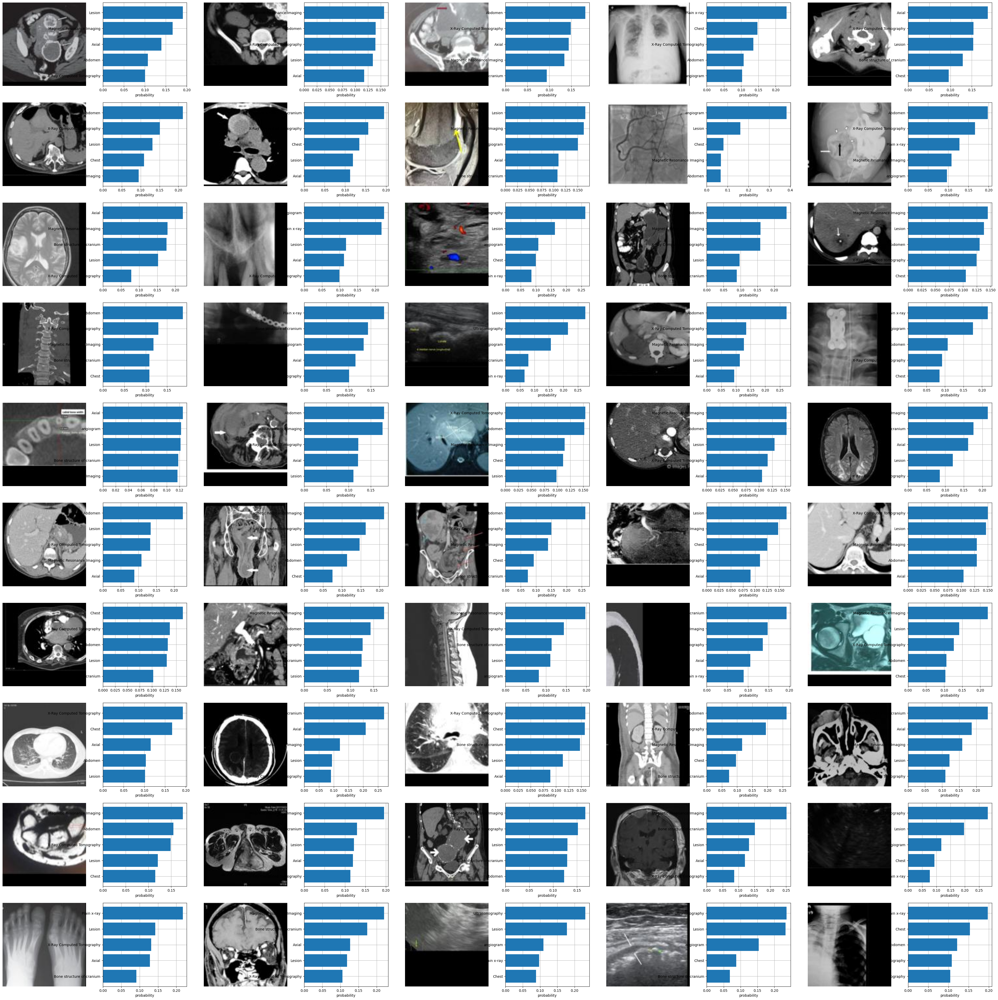

In [102]:
fig = plt.figure(figsize=(50, 50))  # Set the desired figure size
pre_element = "nothing"
counter = 0
for i, element in enumerate(image_filenames):
    if pre_element != element:
      pre_element = element
      image = cv2.imread(f"{CFG.image_path}/{element}.jpg")
      image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
      plt.subplot(10, 10, 2 * counter + 1)
      plt.imshow(image)
      plt.axis("off")

      plt.subplot(10, 10, 2 * counter + 2)
      y = np.arange(top_probs.shape[-1])
      plt.grid()
      plt.barh(y, top_probs[i].numpy())
      plt.gca().invert_yaxis()
      plt.gca().set_axisbelow(True)
      plt.yticks(y, [text_descriptions[index] for index in top_indices[i].numpy()])
      plt.xlabel("probability")
      counter += 1
    else:
      continue

plt.subplots_adjust(wspace=0.5)
plt.show()

In [106]:
import warnings
import warnings
warnings.filterwarnings("ignore")
# Create an empty dataframe
df_zero_shot_top10 = pd.DataFrame(columns=['ID', 'Predicted_Label'])

# Loop through your data and add values to the dataframe
for i, element in enumerate(image_filenames):
  if i < 8320:
    # Assuming 'your_data' is a list of tuples where each tuple contains image_name and labels

    # Split the labels if they are separated by a delimiter like ';'
    labels_list = [text_descriptions[index] for index in top_indices[i].numpy()]

    # Create a new row for each label
    for label in labels_list:
        # Append a new row to the dataframe
        df_zero_shot_top10 = df_zero_shot_top10.append({'ID': element, 'Predicted_Label': label}, ignore_index=True)

In [107]:
df_zero_shot_top10.head()

,ID,Predicted_Label
0,ImageCLEFmedCaption_2022_train_059309,Lesion
1,ImageCLEFmedCaption_2022_train_059309,Magnetic Resonance Imaging
2,ImageCLEFmedCaption_2022_train_059309,Axial
3,ImageCLEFmedCaption_2022_train_059309,Abdomen
4,ImageCLEFmedCaption_2022_train_059309,X-Ray Computed Tomography


In [108]:
top_10_labels = df_top_10['Label'].tolist()
valid_merged_df = valid_merged_df[valid_merged_df['concept'].isin(top_10_labels)]

In [109]:
len(valid_merged_df['ID'].unique()) # So we can see that most images in the dataframe have at least one of the frequent labels

8232

In [110]:
merged_df_true_vs_predicted = pd.merge(valid_merged_df, df_zero_shot_top10, on='ID', how='inner')
merged_df_true_vs_predicted.head(30)

,ID,caption,concept,concept_name,Predicted_Label
0,ImageCLEFmedCaption_2022_train_059309,a woman know to have fibroid which have be tr...,C0040405,X-Ray Computed Tomography,Lesion
1,ImageCLEFmedCaption_2022_train_059309,a woman know to have fibroid which have be tr...,C0040405,X-Ray Computed Tomography,Magnetic Resonance Imaging
2,ImageCLEFmedCaption_2022_train_059309,a woman know to have fibroid which have be tr...,C0040405,X-Ray Computed Tomography,Axial
3,ImageCLEFmedCaption_2022_train_059309,a woman know to have fibroid which have be tr...,C0040405,X-Ray Computed Tomography,Abdomen
4,ImageCLEFmedCaption_2022_train_059309,a woman know to have fibroid which have be tr...,C0040405,X-Ray Computed Tomography,X-Ray Computed Tomography
5,ImageCLEFmedCaption_2022_train_075672,ct scan of abdomen show large calcified mass i...,C0000726,Abdomen,Magnetic Resonance Imaging
6,ImageCLEFmedCaption_2022_train_075672,ct scan of abdomen show large calcified mass i...,C0000726,Abdomen,Abdomen
7,ImageCLEFmedCaption_2022_train_075672,ct scan of abdomen show large calcified mass i...,C0000726,Abdomen,X-Ray Computed Tomography
8,ImageCLEFmedCaption_2022_train_075672,ct scan of abdomen show large calcified mass i...,C0000726,Abdomen,Lesion
9,ImageCLEFmedCaption_2022_train_075672,ct scan of abdomen show large calcified mass i...,C0000726,Abdomen,Axial


In [112]:
len(image_filenames)

8328

In [113]:
relevant_df_true_vs_predicted = merged_df_true_vs_predicted[merged_df_true_vs_predicted['concept_name'] == merged_df_true_vs_predicted['Predicted_Label']]
relevant_df_true_vs_predicted.head()

,ID,caption,concept,concept_name,Predicted_Label
4,ImageCLEFmedCaption_2022_train_059309,a woman know to have fibroid which have be tr...,C0040405,X-Ray Computed Tomography,X-Ray Computed Tomography
6,ImageCLEFmedCaption_2022_train_075672,ct scan of abdomen show large calcified mass i...,C0000726,Abdomen,Abdomen
12,ImageCLEFmedCaption_2022_train_075672,ct scan of abdomen show large calcified mass i...,C0040405,X-Ray Computed Tomography,X-Ray Computed Tomography
16,ImageCLEFmedCaption_2022_train_062467,computed tomography abdomen scan show well def...,C0040405,X-Ray Computed Tomography,X-Ray Computed Tomography
21,ImageCLEFmedCaption_2022_train_009837,chest radiograph show moderate size leave pleu...,C0817096,Chest,Chest


In [114]:
for index, row in merged_df_true_vs_predicted.iterrows():
    if row['ID'] in relevant_df_true_vs_predicted['ID'].values:
       continue
    else:
      new_row = pd.Series({'ID': row['ID'], 'caption': row['caption'], 'concept': row['concept'], 'concept_name': row['concept_name'], 'Predicted_Label': row['Predicted_Label']})
      # Add the row to the dataframe
      relevant_df_true_vs_predicted = relevant_df_true_vs_predicted.append(new_row, ignore_index=True)

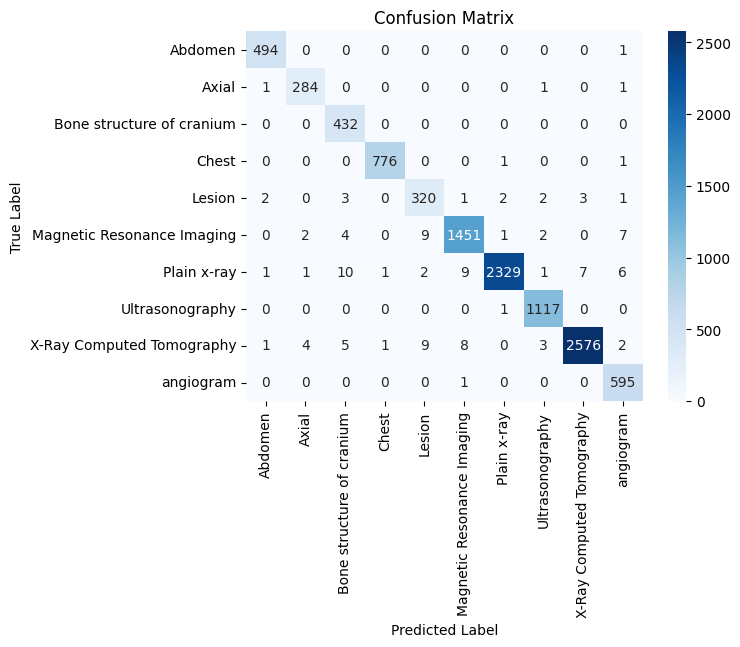

In [115]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

# Get the unique labels from the dataframe
labels = sorted(relevant_df_true_vs_predicted['concept_name'].unique())

# Get the true labels and predicted labels from the dataframe
true_labels = relevant_df_true_vs_predicted['concept_name']
predicted_labels = relevant_df_true_vs_predicted['Predicted_Label']

# Create a mapping from labels to numerical indices
label_to_index = {label: i for i, label in enumerate(labels)}

# Convert true labels and predicted labels to numerical indices
true_indices = true_labels.map(label_to_index)
predicted_indices = predicted_labels.map(label_to_index)

# Compute the confusion matrix
cm = confusion_matrix(true_indices, predicted_indices)

# Create a dataframe from the confusion matrix
cm_df = pd.DataFrame(cm, index=labels, columns=labels)

# Create a heatmap of the confusion matrix using seaborn
sns.heatmap(cm_df, annot=True, fmt='d', cmap='Blues')

# Add labels, title, and axis ticks
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')

# Show the plot
plt.show()
